In [64]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [65]:
# image_1 = cv2.imread('./image_1.jpg', cv2.IMREAD_GRAYSCALE)
# image_2 = cv2.imread("./image_2.jpg", cv2.IMREAD_GRAYSCALE)
image_1 = cv2.imread("M1467919888LE.jpg", cv2.IMREAD_GRAYSCALE)
image_2 = cv2.imread("M1465577656LE.jpg", cv2.IMREAD_GRAYSCALE)

combined_image = np.hstack((image_1, image_2))

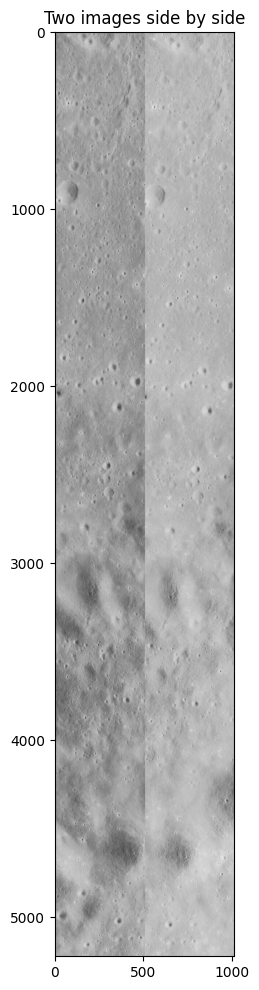

In [66]:
combined_image = cv2.hconcat([image_1, image_2])

plt.figure(figsize=(12, 12))
plt.title('Two images side by side')
plt.imshow(combined_image, cmap='gray')

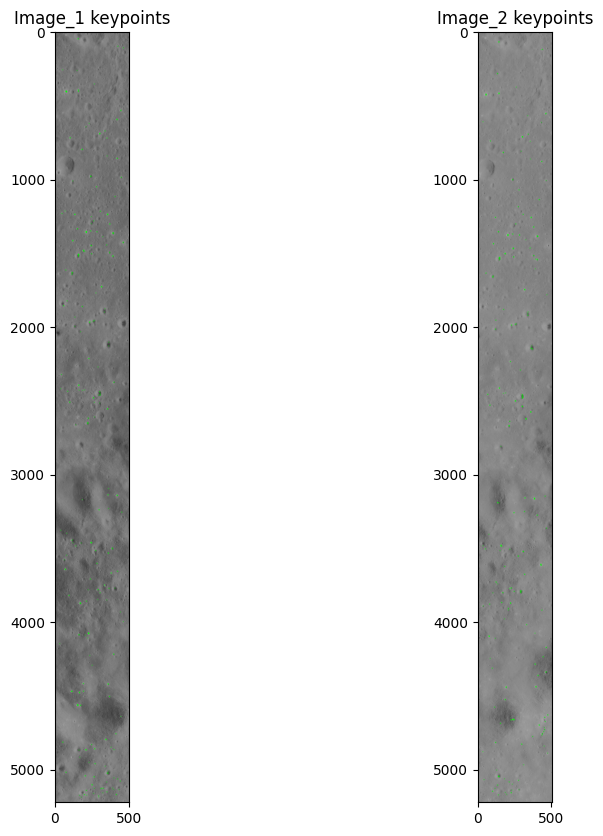

In [67]:
#Display keypoints for both images using ORB
orb = cv2.ORB_create() #Using default values for number of features = 500

keypoints_1, descriptors_1 = orb.detectAndCompute(image_1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(image_2, None)

out_image_2 = np.copy(image_2)
out_image_1 = np.copy(image_1)

out_image_2 = cv2.drawKeypoints(image_2, keypoints_2, out_image_2, color = (0, 255, 0))

out_image_1 = cv2.drawKeypoints(image_1, keypoints_1, out_image_1, color = (0, 255, 0))

fx, plots = plt.subplots(1, 2, figsize=(10,10))
plots[0].set_title("Image_1 keypoints")
plots[0].imshow(out_image_1, cmap='gray')

plots[1].set_title("Image_2 keypoints")
plots[1].imshow(out_image_2, cmap='gray')

In [68]:
len(keypoints_2)

500

In [69]:
def find_and_draw_good_matches(image_1, image_2, keypoints_1, keypoints_2, matches, ratio, is_plot=True):
    """
    Find and draw good matches between reference and query images.

    Args:
        image_1 (numpy.ndarray): Reference image.
        image_2 (numpy.ndarray): Query image.
        ref_keypoints (list): List of keypoints in the reference image.
        query_keypoints (list): List of keypoints in the query image.
        matches (list): List of matches between keypoints.
        ratio (float): Ratio threshold for the ratio test.
        is_plot (bool, optional): Whether to display the matches plot. Defaults to True.

    Returns:
        list: List of good matches.

    """
    # Apply ratio test to find good matches
    good_matches = []
    for higher_match, lower_match in matches:
        if higher_match.distance < ratio * lower_match.distance:
            good_matches.append(higher_match)
    print(f"Number of good matches: {len(good_matches)}")

    # Draw matches
    img_matches = cv2.drawMatches(image_1, keypoints_1, image_2, keypoints_2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    if not is_plot:
        return good_matches
    else: 
        # Display the matches
        plt.figure(figsize=(12, 12))
        plt.imshow(img_matches)
        plt.title("Draw matches")
        plt.axis('off')
        plt.show()
        return good_matches

In [70]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

#knnMatch will return 2 best matches for each descriptor, later we will filter that using ratio test
matches = bf.knnMatch(descriptors_1, descriptors_2, k=2) 
matches

((< cv2.DMatch 0x7fa054dafa30>, < cv2.DMatch 0x7fa0500fe050>),
 (< cv2.DMatch 0x7fa054dc8730>, < cv2.DMatch 0x7fa0552e1ad0>),
 (< cv2.DMatch 0x7fa0501aaf30>, < cv2.DMatch 0x7fa0501ab730>),
 (< cv2.DMatch 0x7fa0501abd50>, < cv2.DMatch 0x7fa0501ab530>),
 (< cv2.DMatch 0x7fa0501ab830>, < cv2.DMatch 0x7fa0501ab8b0>),
 (< cv2.DMatch 0x7fa0501abb70>, < cv2.DMatch 0x7fa0501aaff0>),
 (< cv2.DMatch 0x7fa0501aae30>, < cv2.DMatch 0x7fa0501ab6b0>),
 (< cv2.DMatch 0x7fa0501abeb0>, < cv2.DMatch 0x7fa0501aba70>),
 (< cv2.DMatch 0x7fa0501ab790>, < cv2.DMatch 0x7fa0501ab990>),
 (< cv2.DMatch 0x7fa0501abdf0>, < cv2.DMatch 0x7fa048f5c470>),
 (< cv2.DMatch 0x7fa048f5c490>, < cv2.DMatch 0x7fa048f5c3f0>),
 (< cv2.DMatch 0x7fa048f5c070>, < cv2.DMatch 0x7fa048f5c210>),
 (< cv2.DMatch 0x7fa048f5c370>, < cv2.DMatch 0x7fa048f5c450>),
 (< cv2.DMatch 0x7fa048f5c330>, < cv2.DMatch 0x7fa048f5c2f0>),
 (< cv2.DMatch 0x7fa048f5c350>, < cv2.DMatch 0x7fa048f5c250>),
 (< cv2.DMatch 0x7fa048f5c410>, < cv2.DMatch 0x7fa048f5

Number of good matches: 156


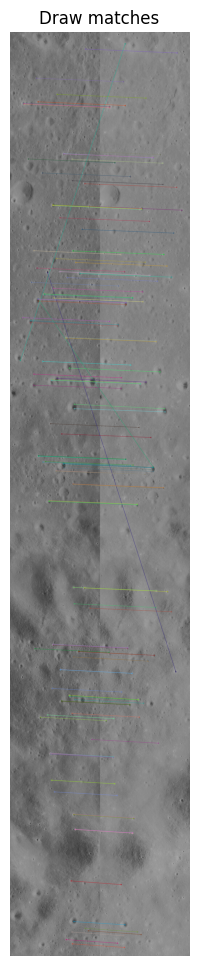

In [71]:
good_matches = find_and_draw_good_matches(image_1, image_2, keypoints_1, keypoints_2, matches, 0.8)

In [72]:
src = np.float32([keypoints_1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
dst = np.float32([keypoints_2[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)

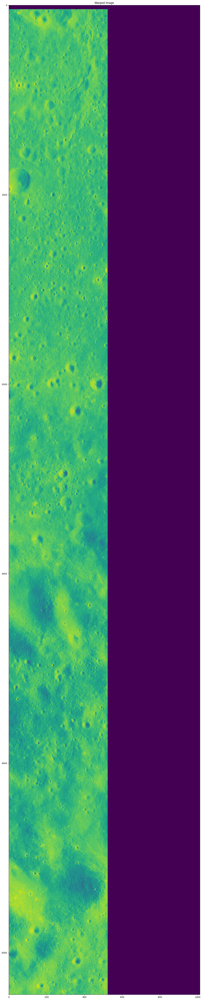

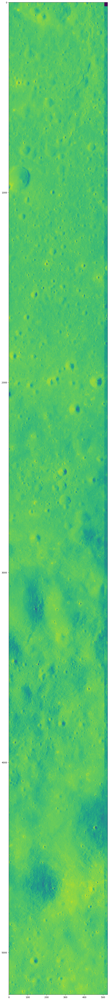

In [73]:
dst = cv2.warpPerspective(image_1,H,(image_2.shape[1] + image_1.shape[1], image_2.shape[0]))
plt.figure(figsize=(80, 80))  # Increase the figure size here
plt.subplot(122)
plt.imshow(dst)
plt.title('Warped Image')
plt.show()

plt.figure(figsize=(80, 80))  # Increase the figure size here
dst[0:image_2.shape[0], 0:image_2.shape[1]] = image_2

# Trim all zero pixels on the edge
nonzero_rows, nonzero_cols = np.nonzero(dst)
trimmed_dst = dst[np.min(nonzero_rows):np.max(nonzero_rows)+1, np.min(nonzero_cols):np.max(nonzero_cols)+1]

cv2.imwrite('output.jpg', trimmed_dst)
plt.imshow(trimmed_dst)
plt.show()

In [74]:
trimmed_dst.shape

(5222, 524)

In [75]:
image_1.shape

(5222, 506)